* Imported Packages

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.preprocessing import LabelEncoder

* Read The Dataset

In [116]:
# Data path
data_path="./data.csv" 

# Read the data file
all_data=pd.read_csv(data_path) 

# Specify the label column
label_column = 'diagnosis'
label_column = label_column.strip() # Remove white spaces from the label column variable

# Label column
y = all_data['diagnosis']

# Drop the label column
X = all_data.drop(label_column, axis=1)
X = X.drop('id', axis=1) 

# Drop empty columns
X = X.dropna(axis=1, how='all')

columns = X.columns.tolist()

# Convert the dataset to numpy
X = np.array(X)

* K-Means Algorithm

In [105]:
def k_means(X, k, max_iters=200):
    # Get the size of X
    n, m = X.shape

    # Choose Random centroids
    centroids = X[np.random.choice(n, k, replace=False)]
    
    # K-means iterations
    for _ in range(max_iters):
        # Get the ecludien distances between each sample and each centroid and save it in a 2d array
        distances = np.linalg.norm(X[:, np.newaxis, :] - centroids, axis=2)

        # Get the the centroid that gives the minimum distance for each sample
        labels = np.argmin(distances, axis=1)

        # Update centroids
        new_centroids = np.array([np.mean(X[labels == j], axis=0) if np.sum(labels == j) > 0 else X[np.random.choice(n)] for j in range(k)])
        
        # Check for convergence
        if np.linalg.norm(new_centroids - centroids) <  0.0001:
            break

        centroids = new_centroids

    return centroids, labels

* PCA Algorithm

In [106]:
def pca(X, num_components):
    # Calculate the mean of the data
    mean = np.mean(X, axis=0)

    # Center the data
    centered_data = X - mean

    # Calculate the covariance matrix
    covariance_matrix = np.cov(centered_data, rowvar=False)

    # Calculate the eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)

    # Sort the eigenvalues and corresponding eigenvectors in descending order
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]
    
    # Select the top 'num_components' eigenvectors
    components = eigenvectors[:, :num_components]

    # Project the centered data onto the selected eigenvectors to obtain the transformed data
    transformed_data = np.dot(centered_data, components)
    
    return transformed_data, components

* Elbow Method Function

In [107]:
def elbow_method(X, max_k=10):
    sse_values = []
    
    for k in range(1, max_k + 1):
        # Apply k-means at each k value
        centroids, labels = k_means(X, k)

        # Calculate the SSE for each k-means 
        sse = np.sum(np.linalg.norm(X - centroids[labels], axis=1)**2)
        sse_values.append(sse)
    
    # Return all SSE values
    return sse_values

* Experiment 1: K-Means Clustering 

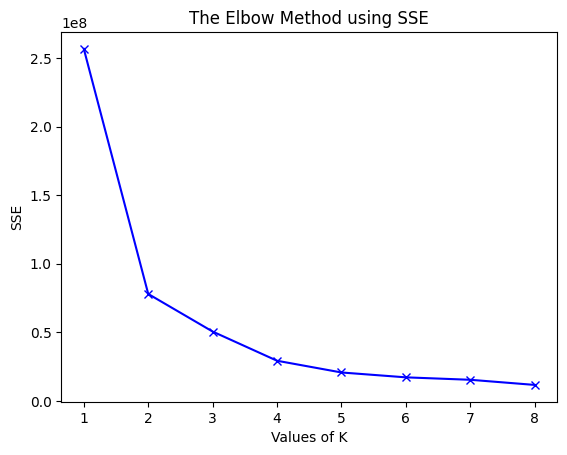

K-Means Optimal K: 2


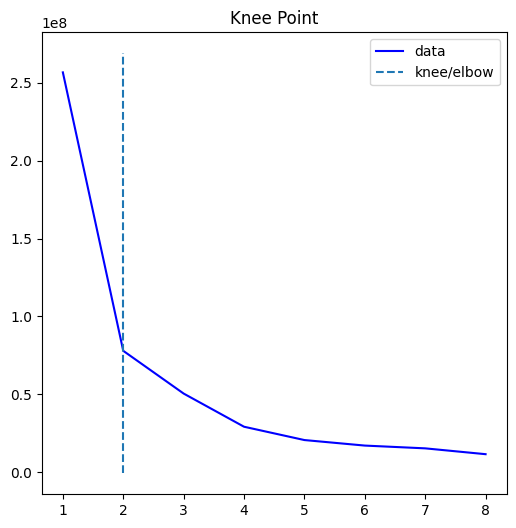

In [108]:
# Define the max_k and range of k for iterations 
max_k = 8
k_range = range(1, 9)

# Apply Elbow Method to get the optimal k 
sse_values_exp1 = elbow_method(X, max_k)

# Plot the sse values with k values
plt.plot(k_range, sse_values_exp1, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('SSE')
plt.title('The Elbow Method using SSE')
plt.show()

# calculate and show elbow
kneedle = KneeLocator(k_range, sse_values_exp1, curve='convex', direction='decreasing')
elbow_point = kneedle.elbow # Get the elbow point
kneedle.plot_knee()

print(f'K-Means Optimal K: {elbow_point}')

# perform K-means with the optimal k
centroids_exp1, labels_exp1 = k_means(X, elbow_point)

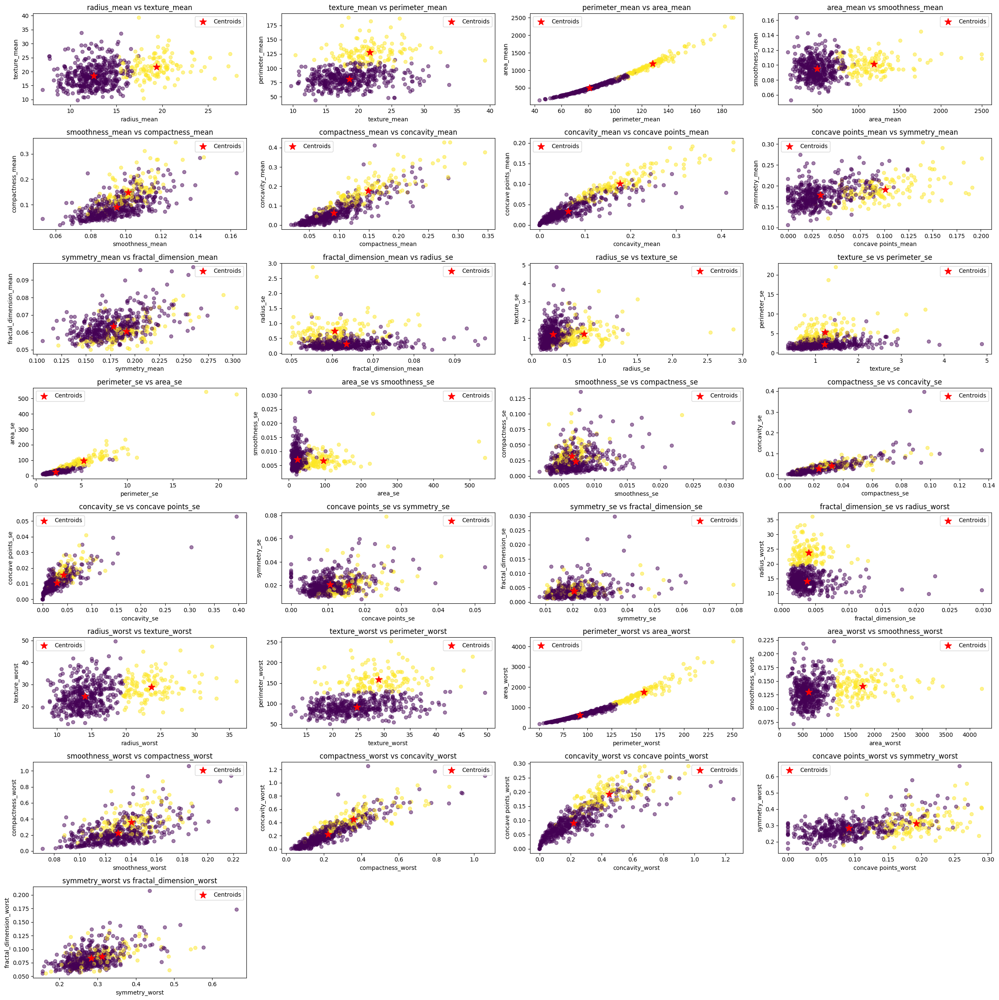

In [109]:
# Visualize Data of K-Means Clusturing
plt.figure(figsize=(24, 24))
j = 1
for i in range(0, X.shape[1] - 1):
    plt.subplot(8, 4, j)
    j += 1
    plt.scatter(X[:, i], X[:, i+1], c=labels_exp1, cmap='viridis', alpha=0.5)
    plt.scatter(centroids_exp1[:, i], centroids_exp1[:, i+1], c='red', marker='*', s=150, label='Centroids')
    plt.title(f'{columns[i]} vs {columns[i+1]}')
    plt.xlabel(f'{columns[i]}')
    plt.ylabel(f'{columns[i+1]}')
    plt.legend()

plt.tight_layout()
plt.show()

* Experiment 2: PCA + K-Means Clustering

In [117]:
 # Experiment with different numbers of principal components
num_components_list = [2, 3, 4, 5, 6] 
sse_values_pca = []
max_k = 9
k_range = range(1, 10)

# Loop over different number of components
for num_components in num_components_list:
    # Get transformed X with each num_components
    X_pca, _ = pca(X, num_components)

    # Calculate its SSE using elbow method
    sse_values = elbow_method(X_pca, max_k)

    # Get the optimal K 
    kneedle = KneeLocator(k_range, sse_values, curve='convex', direction='decreasing')
    optimal_k_exp2 = kneedle.elbow

    # Apply K-Means Clustering
    centroids_exp2, labels_exp2 = k_means(X_pca, optimal_k_exp2)

    # Get the SSE for this clustering
    sse_exp2 = sse_values[optimal_k_exp2-1]
    sse_values_pca.append(sse_values[optimal_k_exp2-1])
    print(f'SSE of PCA + K-Means Clustering with Num_Components = {num_components} is {sse_exp2}')

# Get the best Num_Component
best_pc_value = np.argmin(sse_values_pca) + 2
print(f'\nBest Number of Components is {best_pc_value}')

SSE of PCA + K-Means Clustering with Num_Components = 2 is 77487123.40340453
SSE of PCA + K-Means Clustering with Num_Components = 3 is 77886327.87338167
SSE of PCA + K-Means Clustering with Num_Components = 4 is 77917343.08362162
SSE of PCA + K-Means Clustering with Num_Components = 5 is 77939996.63850088
SSE of PCA + K-Means Clustering with Num_Components = 6 is 77941702.11700766

Best Number of Components is 2


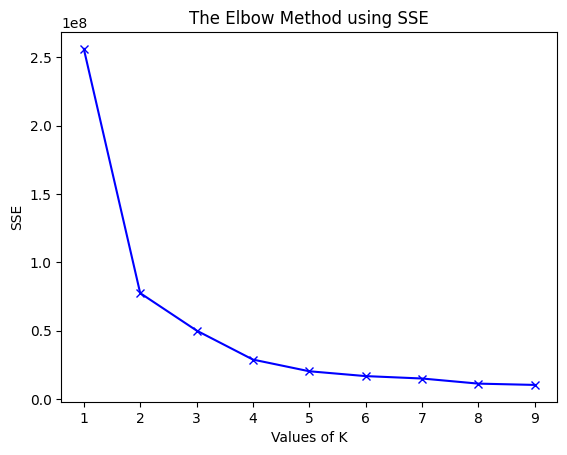

PCA + K-Means Optimal K: 2


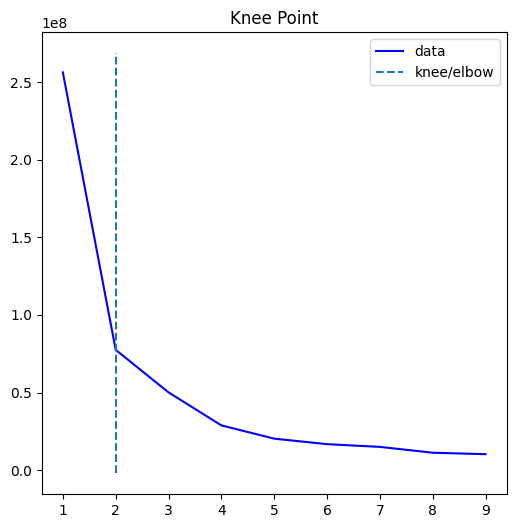

In [111]:
# Apply PCA + K-Means Clustering using best num_component
transformed_X, _ = pca(X, best_pc_value)

# Apply elbow method on the transformed X to get the optimal k
sse_values_exp2 = elbow_method(transformed_X, max_k)

# Plot the SSE values with K values
plt.plot(k_range, sse_values_exp2, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('SSE')
plt.title('The Elbow Method using SSE')
plt.show()

# Get the elbow point
kneedle = KneeLocator(k_range, sse_values_exp2, curve='convex', direction='decreasing')
optimal_k_exp2 = kneedle.elbow
kneedle.plot_knee()

print(f'PCA + K-Means Optimal K: {optimal_k_exp2}')

# Apply K-Means on the transformed X with th otimal k
centroids_exp2, labels_exp2 = k_means(transformed_X, optimal_k_exp2)

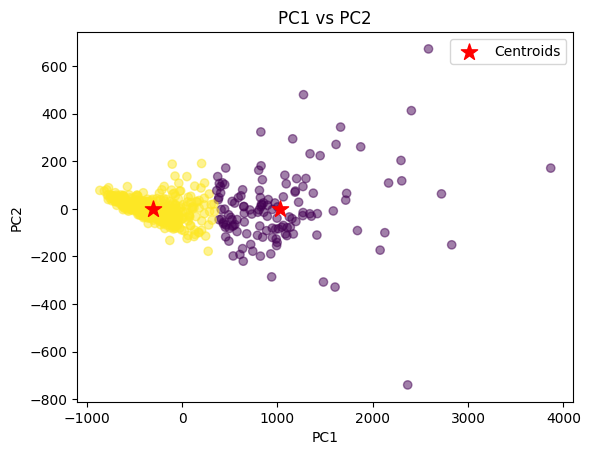

In [112]:
# Visualize Data of PCA + K-means Clustering
plt.scatter(transformed_X[:, 0], transformed_X[:, 1], c=labels_exp2, cmap='viridis', alpha=0.5)
plt.scatter(centroids_exp2[:, 0], centroids_exp2[:, 1], c='red', marker='*', s=150, label='Centroids')
plt.title('PC1 vs PC2')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

- After using PCA, it appears that the performance of the clustering is better as the two clusters are not overlapping

* Comparison Between SSE of Both Experiments

In [113]:
# Compare between the SSE of both Experiments
sse_exp1 = np.sum(np.linalg.norm(X - centroids_exp1[labels_exp1], axis=1)**2)
sse_exp2 = np.sum(np.linalg.norm(transformed_X - centroids_exp2[labels_exp2], axis=1)**2)

print(f'SSE of K-Means Clustering = {sse_exp1}')
print(f'SSE of PCA + K-Means Clustering = {sse_exp2}')

SSE of K-Means Clustering = 77943099.87829883
SSE of PCA + K-Means Clustering = 77487123.40340453


- SSE of the PCA + K-Means is lower than that of the K-Means only
- PCA improves clustering performance as it maps the dataset to a low dimensional space by transforming it into a new set of uncorrelated variables, called principal components. It returns only the most important components which have high variance

* Compare The Clusters With The Original Labels

In [114]:
# Encode the original label to compare it with the clusters
label_encoder = LabelEncoder()
numerical_y = label_encoder.fit_transform(y)

# Print the mapping of original labels to numerical labels
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label Mapping:", label_mapping)

Label Mapping: {'B': 0, 'M': 1}


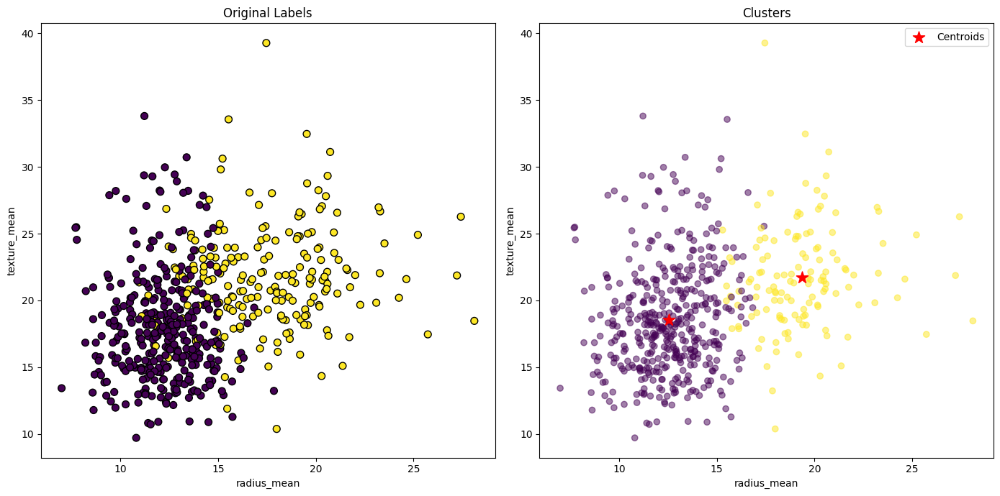

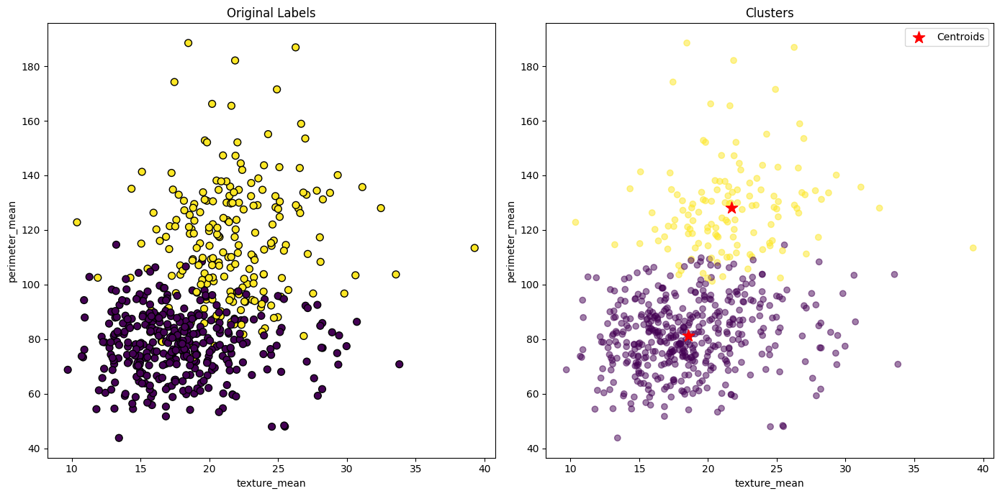

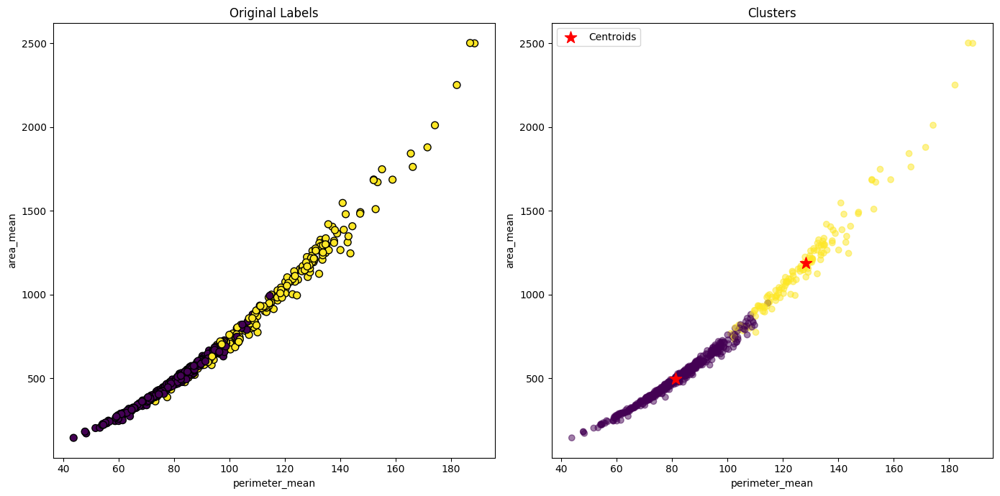

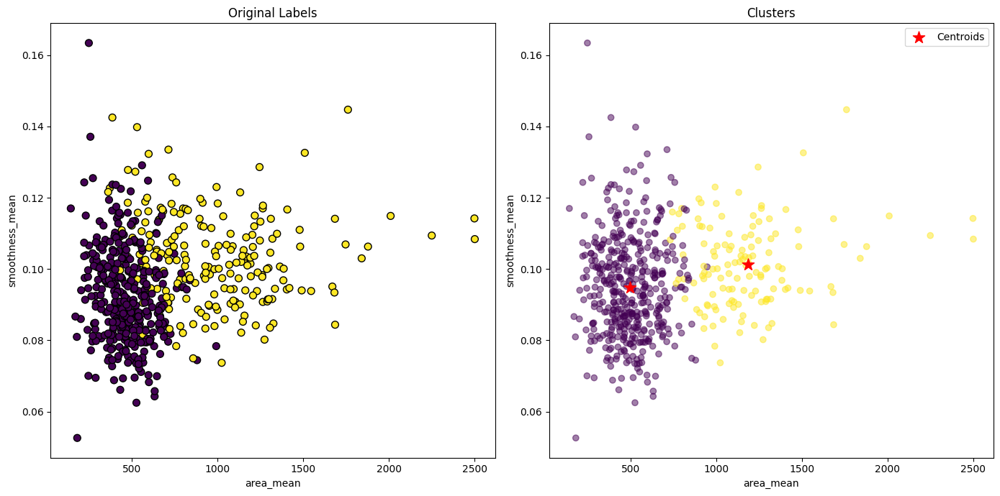

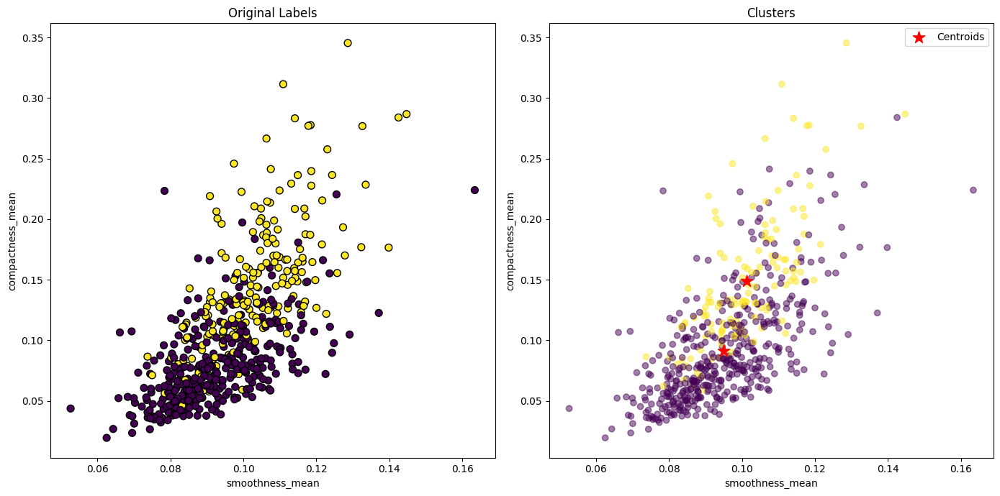

...

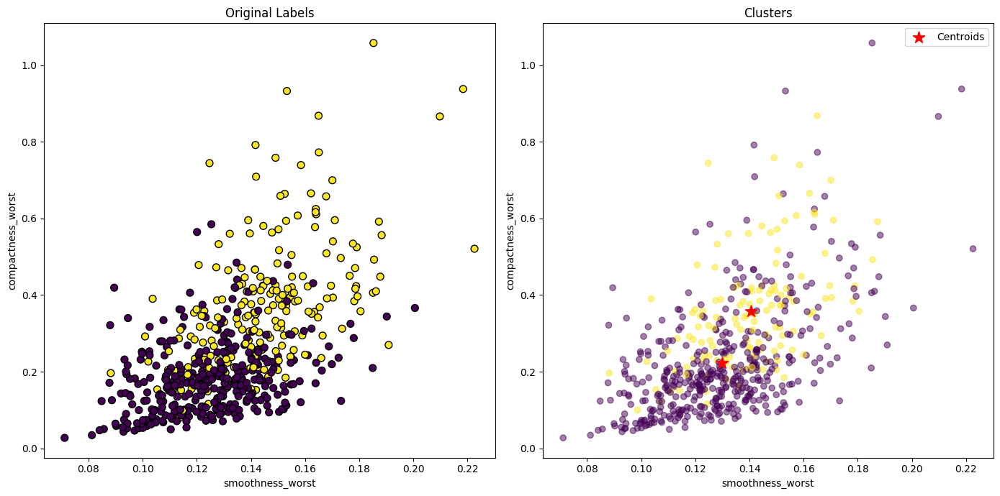

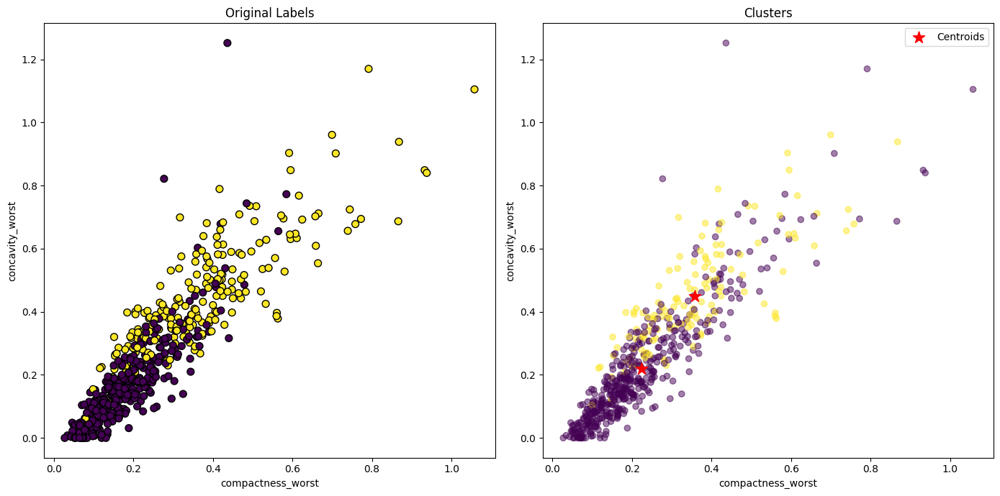

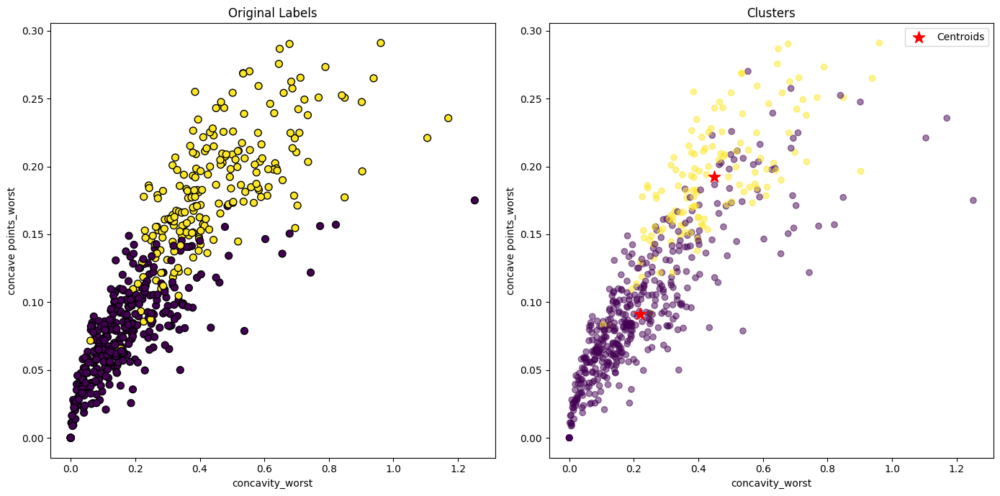

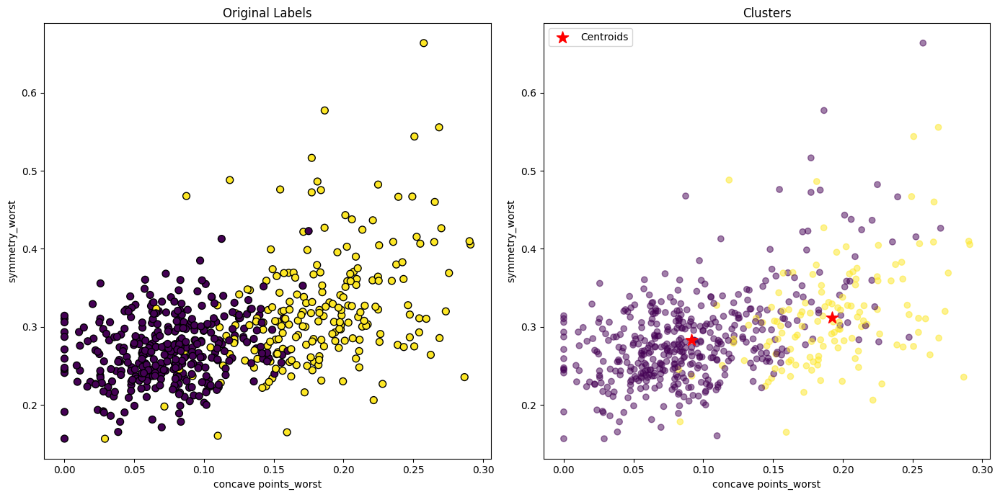

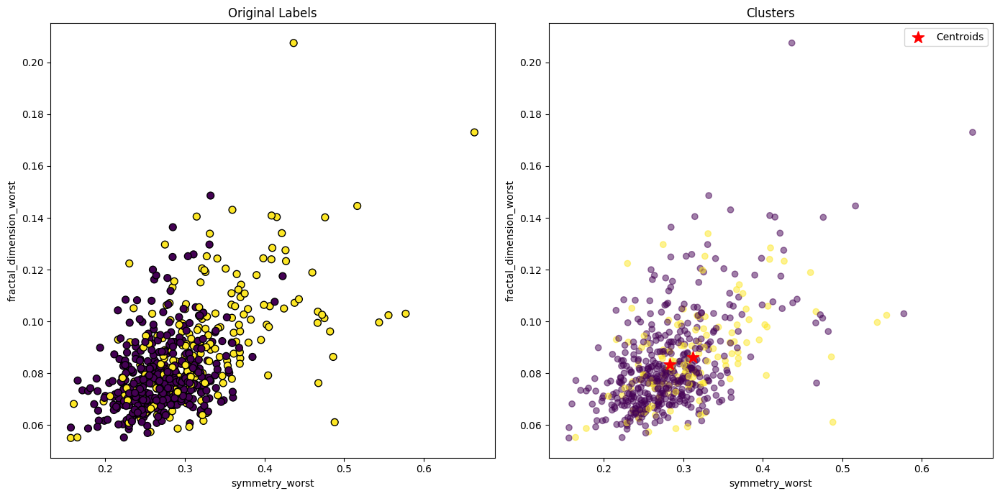

In [115]:
# Visualization to Compare Clusters with the original labels
for i in range(0, X.shape[1] - 1):
    plt.figure(figsize=(14, 7))

    plt.subplot(1,2,1)
    plt.scatter(X[:, i], X[:, i+1], c=numerical_y, cmap='viridis', edgecolor='k', s=50, label='Original Labels')
    plt.title(f'Original Labels')
    plt.xlabel(f'{columns[i]}')
    plt.ylabel(f'{columns[i+1]}')


    plt.subplot(1,2,2)
    plt.scatter(X[:, i], X[:, i+1], c=labels_exp1, cmap='viridis', alpha=0.5)
    plt.scatter(centroids_exp1[:, i], centroids_exp1[:, i+1], c='red', marker='*', s=150, label='Centroids')
    plt.title(f'Clusters')
    plt.xlabel(f'{columns[i]}')
    plt.ylabel(f'{columns[i+1]}')
    plt.legend()

    plt.tight_layout()
    plt.show()



- The original labels and the clusters are identical